# Interpretability Methods for CNNs 

In [99]:
import matplotlib.pyplot as plt
from data import get_img_dataset
from torchvision import transforms
import torch
from torch.utils.data import TensorDataset, DataLoader
import numpy as np

from model import BaselineClf
from torch.nn import CrossEntropyLoss
from torch.optim import Adam, SGD

import random
random.seed(0)
torch.manual_seed(0)
np.random.seed(0)

transform = [transforms.RandomRotation(90), transforms.RandomHorizontalFlip()]
train_dataset, val_dataset, test_dataset = get_img_dataset(transform)

# Not shuffling because no model will be trained, only interpreatbility tasks performed 
trainloader = DataLoader(train_dataset,shuffle=False)
testloader = DataLoader(test_dataset,  shuffle=False)
validloader = DataLoader(val_dataset,  shuffle=False)

Loaded samples into dataset with label 'no'=0 and 'yes'=1


# Integrated Gradients with Captum

In [26]:
model = BaselineClf()
model.load_state_dict(torch.load("baselineCNN_first.pt"))
model.eval()

BaselineClf(
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): Re

In [136]:
from captum.attr import IntegratedGradients

def plot_integrated_grads(data, model,  idx=1, plot=True):

    sample = data[0].unsqueeze(0)
    #sample.requires_grad = True
    sample_class = data[1]

    ig = IntegratedGradients(model)
    attributions_1, approximation_error_1 = ig.attribute(sample, target=sample_class,
                                        return_convergence_delta=True)
    attributions_2, approximation_error_2 = ig.attribute(sample, target=1-sample_class,
                                        return_convergence_delta=True)
    
    if plot:
        f, axs = plt.subplots(1,3, figsize=(20, 10))
        f.suptitle(f"Integrated Gradients for Image {idx}", fontsize=14)
        divnorm=colors.TwoSlopeNorm(vcenter=0.)
                                                         
        axs[0].imshow( np.array(sample.numpy().squeeze()[0]), cmap= 'gray')
        axs[0].set_title(f'Original Image')                                               
        
        axs[1].imshow( np.array(attributions_1.detach().numpy().squeeze()[0]),
                    cmap= 'RdBu', norm=divnorm)
        axs[1].set_title(f'Integrated Gradients \n for Class {sample_class} (Correct)')
        axs[2].imshow( np.array(attributions_2.detach().numpy().squeeze()[0]),
                    cmap= 'RdBu', norm=divnorm)
        axs[2].set_title(f'Integrated Gradients \n for Class {1-sample_class} (Incorrect)') 
                                                        
        f.savefig(f'images/integ_grads_{idx}_{sample_class}.png')
        
    
    #return attributions_1, approximation_error_1,attributions_2, approximation_error_2


C:\Users\User\AppData\Local\Temp\ipykernel_27508\3539283348.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axs = plt.subplots(1,3, figsize=(20, 10))


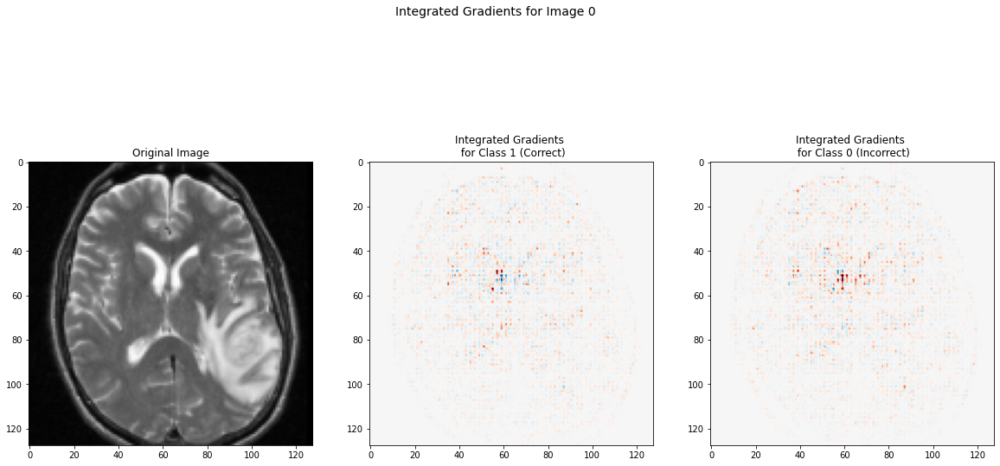

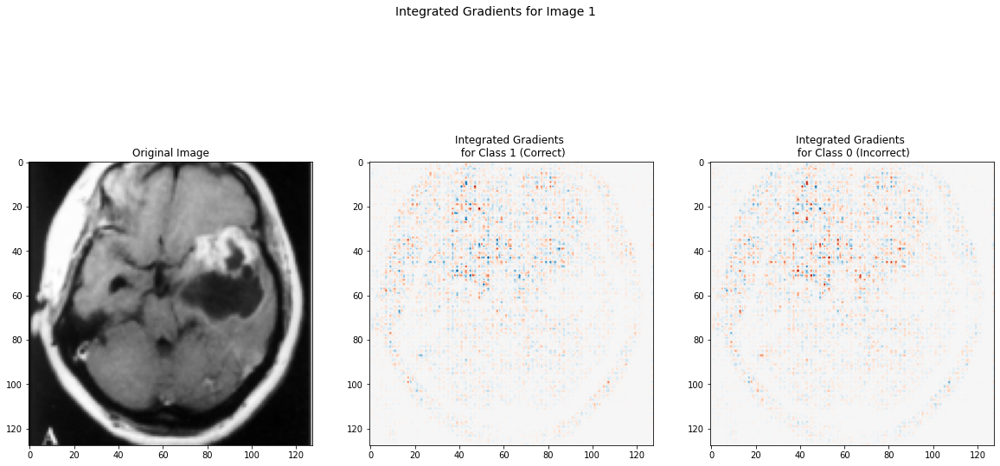

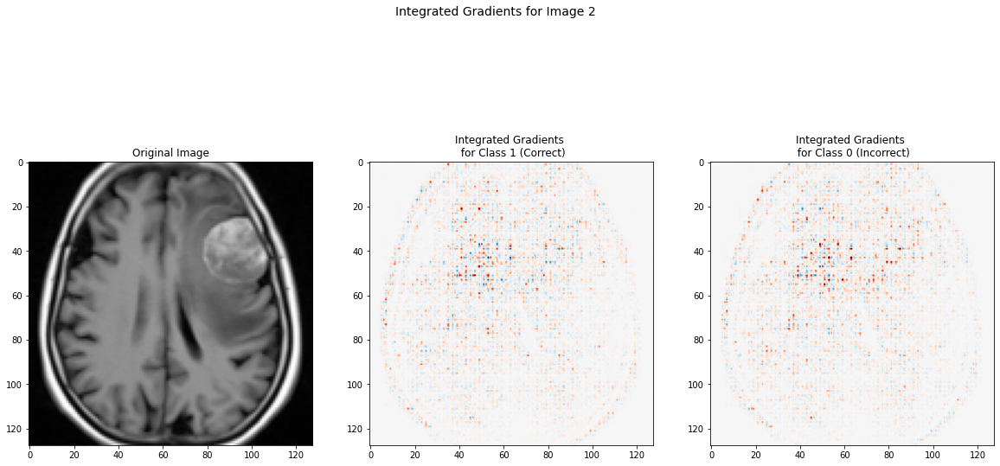

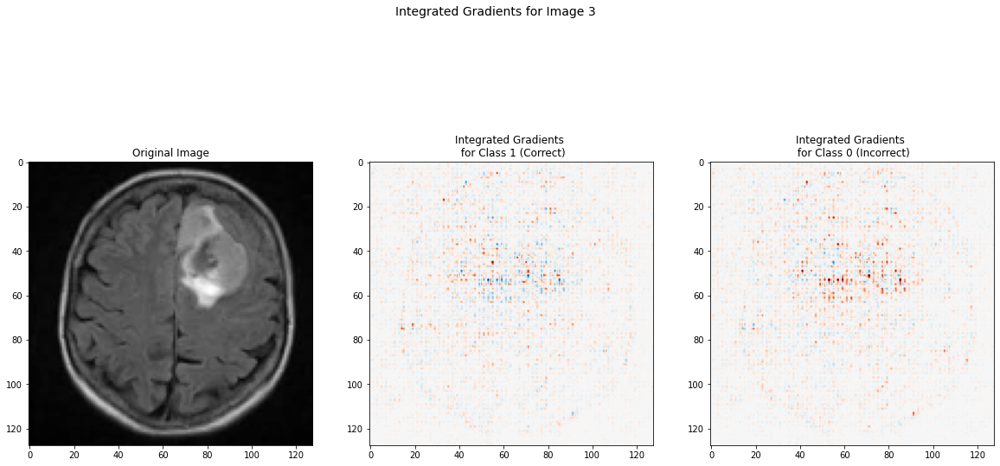

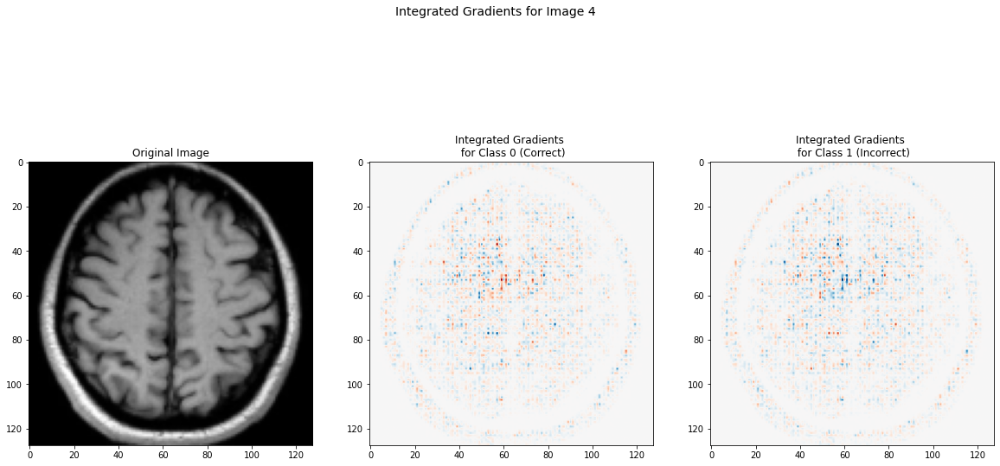

...

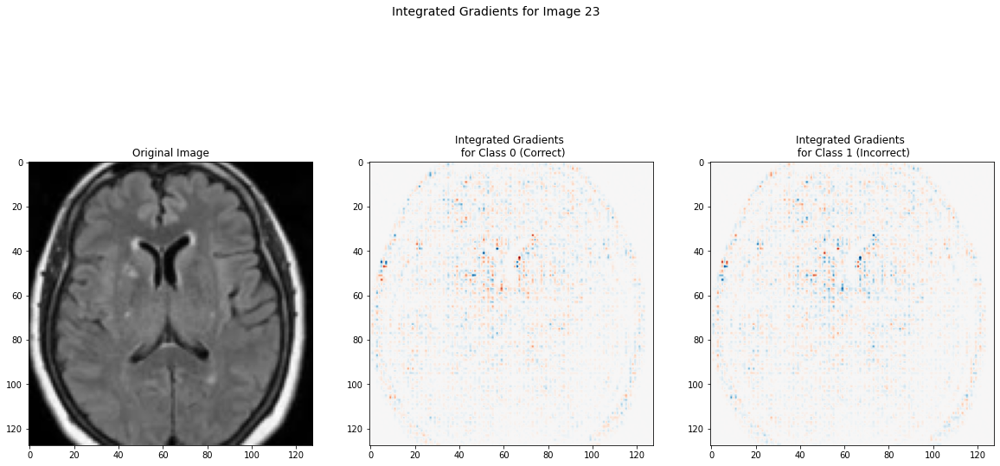

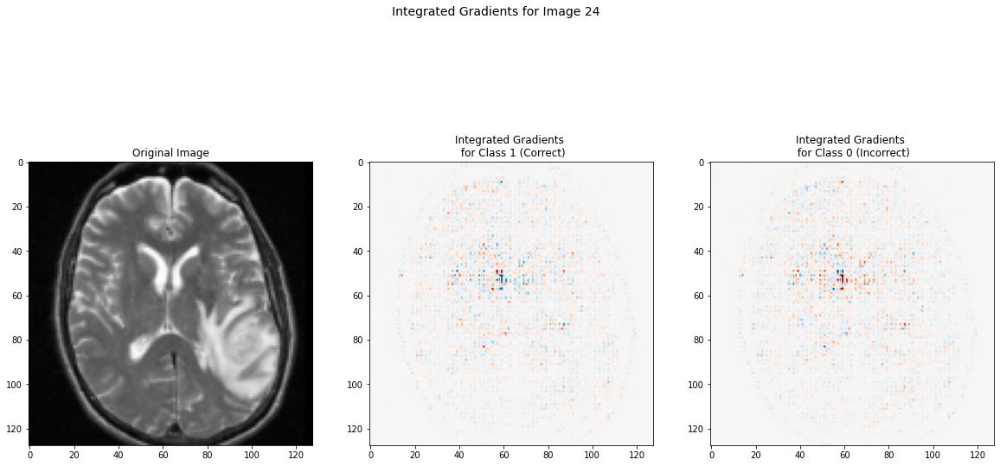

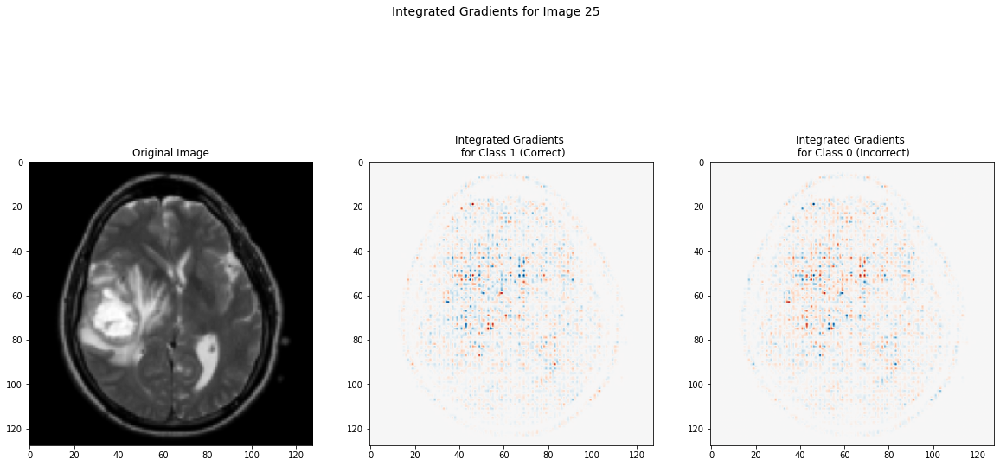

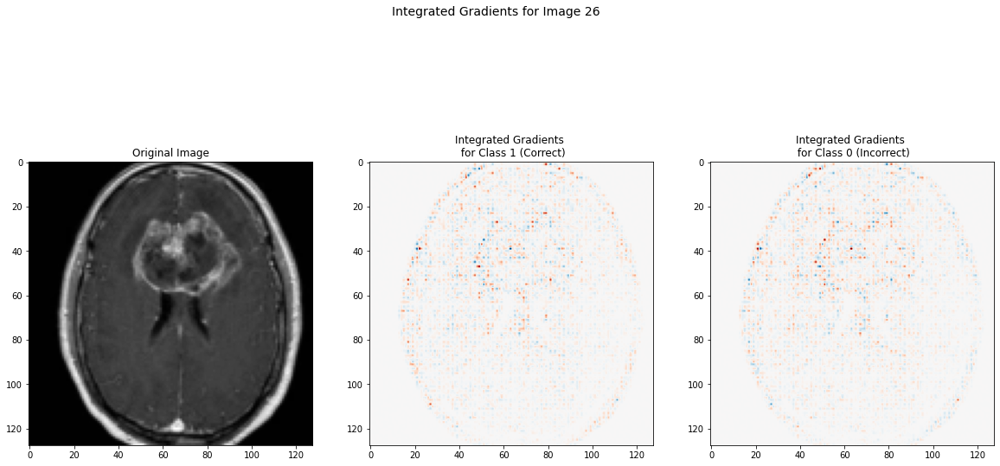

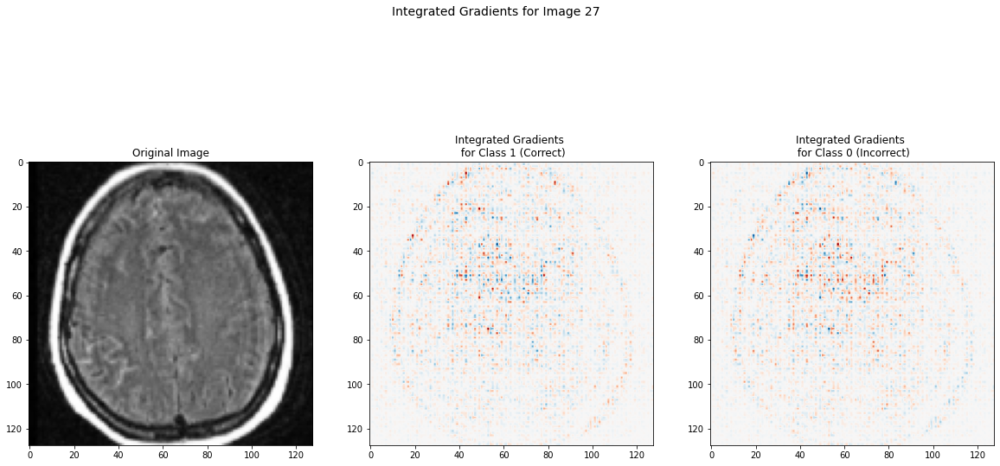

In [138]:
validloader = DataLoader(val_dataset,  shuffle=False)
it = iter(val_dataset)
for i in range(len(val_dataset)):
    plot_integrated_grads(next(it), model, i)

## To be continued --- other methods to do 

In [6]:
# set the evaluation mode

# get the image from the dataloader
img, y = next(iter(validloader))

img = img[1:2]
pred = pred[1:2]

# get the most likely prediction of the model
pred = model(img).argmax(dim=1)

print(img.shape)

NameError: name 'pred' is not defined

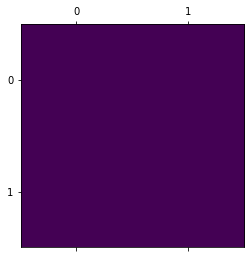

In [38]:
# get the gradient of the output with respect to the parameters of the model
#pred.backward(torch.ones(pred.size()),retain_variables=True)

# pull the gradients out of the model
gradients = model.get_grad()

# pool the gradients across the channels
pooled_gradients = gradients[0]

# get the activations of the last convolutional layer
activations = model.get_conv_activation(img).detach()

# weight the channels by corresponding gradients
for i in range(512):
    activations[:, i, :, :] *= pooled_gradients[i]
    
# average the channels of the activations
heatmap = torch.mean(activations, dim=1).squeeze()

# relu on top of the heatmap
# expression (2) in https://arxiv.org/pdf/1610.02391.pdf
heatmap = np.maximum(heatmap, 0)



# draw the heatmap
plt.matshow(heatmap.squeeze())